## MusicGen

The MusicGen model can be de-composed into three distinct stages:
1. The text descriptions are passed through a frozen text encoder model to obtain a sequence of hidden-state representations
2. The MusicGen decoder is then trained to predict discrete audio tokens, or *audio codes*, conditioned on these hidden-states
3. These audio tokens are then decoded using an audio compression model, such as EnCodec, to recover the audio waveform

The pre-trained MusicGen checkpoints use Google's [t5-base](https://huggingface.co/t5-base) as the text encoder model, and [EnCodec 32kHz](https://huggingface.co/facebook/encodec_32khz) as the audio compression model. The MusicGen decoder is a pure language model architecture,
trained from scratch on the task of music generation.

## Prepare the Environment

In [ ]:
# setting up export env variable if using HPC infra

import os
    
if 'LAPTOP-8I2BSKHD' in os.environ.get('NAME', ''):
    print("Select the conda environment 'music-gen'")


if 'hpc.itc.rwth-aachen.de' in os.environ.get('R_HOSTNAME', ''):
    ! pip install scipy==1.10.1

    ! pip install -q transformers==4.31.0 accelerate==0.21.0
    ! pip install -q datasets==2.14.1

    # specific versions of pytorch and cuda are required to run MusicGen
    ! pip3 install -q --user torch==2.0.1
    ! pip install -q --user nvidia-cudnn-cu11==8.5.0.96

    os.environ['PATH'] = "/home/vt367012/.local/bin:" + os.environ['PATH']

In [6]:
!nvidia-smi

/bin/bash: nvidia-smi: command not found


In [7]:
from transformers import MusicgenForConditionalGeneration, AutoProcessor
import datasets
import torch
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Audio
import scipy

device = "cuda" if torch.cuda.is_available() else "cpu"

device

/home/chirag/anaconda3/envs/thesis/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


'cpu'

## Load the Model



[Pre-trained weights](https://huggingface.co/models?search=facebook/musicgen-) on the Hugging Face Hub

In [6]:
model = MusicgenForConditionalGeneration.from_pretrained("facebook/musicgen-small")

_ = model.to(device)

## Generation

MusicGen is compatible with two generation modes: greedy and sampling. In practice, sampling leads to significantly
better results than greedy, thus we encourage sampling mode to be used where possible. Sampling is enabled by default,
and can be explicitly specified by setting `do_sample=True` in the call to `MusicgenForConditionalGeneration.generate` (see below).

### Unconditional Generation

The inputs for unconditional (or 'null') generation can be obtained through the method `MusicgenForConditionalGeneration.get_unconditional_inputs`. We can then run auto-regressive generation using the `.generate` method, specifying `do_sample=True` to enable sampling mode:

In [7]:
unconditional_inputs = model.get_unconditional_inputs(num_samples=1)


# max_new_tokens can decide the length of the music (look below)
audio_values = model.generate(**unconditional_inputs, do_sample=True, max_new_tokens=1000)

In [8]:
unconditional_inputs

MusicgenUnconditionalInput(encoder_outputs=(tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 

In [9]:
print(audio_values.shape)

print(audio_values)

torch.Size([1, 1, 638080])
tensor([[[0.0626, 0.0601, 0.0951,  ..., 0.1170, 0.1132, 0.1288]]],
       device='cuda:0')


The audio outputs are a three-dimensional Torch tensor of shape `(batch_size, num_channels, sequence_length)`. To listen
to the generated audio samples, you can either play them in an ipynb notebook:

In [12]:
sampling_rate = model.config.audio_encoder.sampling_rate
Audio(audio_values[0].cpu().numpy(), rate=sampling_rate)

In [27]:
# save the generated music

tensor_path = './music_samples/unconditional_generated_sample_1.pt'

if os.path.exists(tensor_path) == False:
    torch.save(audio_values, tensor_path)
    print("Tensor saved!")

In [20]:
# sampling_rate = number of tokens required to get 1 second of audio

audio_values.shape[2] / sampling_rate

19.94

Or save them as a `.wav` file using a third-party library, e.g. `scipy` (note here that we also need to remove the channel dimension from our audio tensor):

In [ ]:
scipy.io.wavfile.write("musicgen_out.wav", rate=sampling_rate, data=audio_values[0, 0].cpu().numpy())

The argument `max_new_tokens` specifies the number of new tokens to generate. As a rule of thumb, you can work out the length of the generated audio sample in seconds by using the frame rate of the EnCodec model:

In [21]:
# audio_length_in_s = max_new_tokens / frame_rate

audio_length_in_s = 256 / model.config.audio_encoder.frame_rate

audio_length_in_s

5.12

### Text-Conditional Generation

The model can generate an audio sample conditioned on a text prompt through use of the `MusicgenProcessor` to pre-process
the inputs. The pre-processed inputs can then be passed to the `.generate` method to generate text-conditional audio samples.
Again, we enable sampling mode by setting `do_sample=True`:

In [33]:
processor = AutoProcessor.from_pretrained("facebook/musicgen-small")

prompts = ["80s pop track with bassy drums and synth", "90s rock song with loud guitars and heavy drums"]

inputs = processor(
    text=prompts,
    padding=True,
    return_tensors="pt",
)

audio_values = model.generate(**inputs.to(device), do_sample=True, guidance_scale=3, max_new_tokens=256)

for i in range(audio_values.shape[0]):
    print(prompts[i])
    display(Audio(audio_values[i].cpu().numpy(), rate=sampling_rate))

80s pop track with bassy drums and synth


90s rock song with loud guitars and heavy drums


In [34]:
# save the generated music

for i in range(audio_values.shape[0]):
    tensor_path = f"./music_samples/conditional_generated_sample_{prompts[i].replace(' ', '_')}.pt"
    
    if os.path.exists(tensor_path) == False:
        torch.save(audio_values[i], tensor_path)
        print(f"Tensor for '{prompts[i]}' saved!")

Tensor for '90s rock song with loud guitars and heavy drums' saved!


The `guidance_scale` is used in classifier free guidance (CFG), setting the weighting between the conditional logits
(which are predicted from the text prompts) and the unconditional logits (which are predicted from an unconditional or
'null' prompt). A higher guidance scale encourages the model to generate samples that are more closely linked to the input
prompt, usually at the expense of poorer audio quality. CFG is enabled by setting `guidance_scale > 1`. For best results,
use a `guidance_scale=3` (default) for text and audio-conditional generation.

### Audio-Prompted Generation

The same `MusicgenProcessor` can be used to pre-process an audio prompt that is used for audio continuation. In the
following example, we load an audio file using the 🤗 Datasets library, pre-process it using the processor class,
and then forward the inputs to the model for generation:

In [35]:
from datasets import load_dataset

dataset = load_dataset("sanchit-gandhi/gtzan", split="train", streaming=True)
sample = next(iter(dataset))["audio"]

# take the first half of the audio sample
sample["array"] = sample["array"][: len(sample["array"]) // 2]

text=["80s blues track with groovy saxophone"]

inputs = processor(
    audio=sample["array"],
    sampling_rate=sample["sampling_rate"],
    text=text,
    padding=True,
    return_tensors="pt",
)

audio_values = model.generate(**inputs.to(device), do_sample=True, guidance_scale=3, max_new_tokens=256)

print("Input audio")
display(Audio(sample["array"], rate=sample["sampling_rate"]))

print("Generated audio (an extension of input audio)")
display(Audio(audio_values[0].cpu().numpy(), rate=sampling_rate))

Input audio


Generated audio (an extension of input audio)


In [36]:
# save the generated music

input_audio_tensor_path = f"./music_samples/conditional_input_sample_{text[0].replace(' ', '_')}.pt"
generated_audio_tensor_path = f"./music_samples/conditional_generated_sample_{text[0].replace(' ', '_')}.pt"

if os.path.exists(input_audio_tensor_path) == False:
    torch.save(sample["array"], input_audio_tensor_path)
    print(f"Tensor '{input_audio_tensor_path}' saved!")
    
if os.path.exists(generated_audio_tensor_path) == False:
    torch.save(audio_values[0], generated_audio_tensor_path)
    print(f"Tensor '{generated_audio_tensor_path}' saved!")

Tensor './music_samples/conditional_input_sample_80s_blues_track_with_groovy_saxophone.pt' saved!
Tensor './music_samples/conditional_generated_sample_80s_blues_track_with_groovy_saxophone.pt' saved!


In [ ]:
sample

{'path': 'blues.00000.wav',
 'array': array([0.0071735 , 0.01503155, 0.01544898, ..., 0.23026443, 0.19199896,
        0.15125401]),
 'sampling_rate': 32000}

In [ ]:
sample['array'].shape[0] / sample["sampling_rate"]

15.00665625

To demonstrate batched audio-prompted generation, we'll slice our sample audio by two different proportions to give two audio samples of different length.
Since the input audio prompts vary in length, they will be *padded* to the length of the longest audio sample in the batch before being passed to the model.

To recover the final audio samples, the `audio_values` generated can be post-processed to remove padding by using the processor class once again:

In [37]:
sample = next(iter(dataset))["audio"]

# take the first quater of the audio sample
sample_1 = sample["array"][: len(sample["array"]) // 4]

# take the first half of the audio sample
sample_2 = sample["array"][: len(sample["array"]) // 2]

inputs = processor(
    audio=[sample_1, sample_2],
    sampling_rate=sample["sampling_rate"],
    text=["80s blues track with groovy saxophone", "90s rock song with loud guitars and heavy drums"],
    padding=True,
    return_tensors="pt",
)

audio_values = model.generate(**inputs.to(device), do_sample=True, guidance_scale=3, max_new_tokens=256)

# post-process to remove padding from the batched audio
audio_values = processor.batch_decode(audio_values, padding_mask=inputs.padding_mask)


print("First input sample")
display(Audio(sample_1, rate=sample["sampling_rate"]))

print("First generated audio")
display(Audio(audio_values[0], rate=model.config.audio_encoder.sampling_rate))

print("\n\nSecond input sample")
display(Audio(sample_2, rate=sample["sampling_rate"]))

print("Second generated audio")
display(Audio(audio_values[1], rate=model.config.audio_encoder.sampling_rate))


First input sample


First generated audio




Second input sample


Second generated audio


## Generation Config

The default parameters that control the generation process, such as sampling, guidance scale and number of generated tokens, can be found in the model's generation config, and updated as desired. Let's first inspect the default generation config:

In [ ]:
model.generation_config

GenerationConfig {
  "_from_model_config": true,
  "bos_token_id": 2048,
  "decoder_start_token_id": 2048,
  "do_sample": true,
  "guidance_scale": 3.0,
  "max_length": 1500,
  "pad_token_id": 2048,
  "transformers_version": "4.31.0"
}

Alright! We see that the model defaults to using sampling mode (`do_sample=True`), a guidance scale of 3, and a maximum generation length of 1500 (which is equivalent to 30s of audio). You can update any of these attributes to change the default generation parameters:

In [ ]:
# increase the guidance scale to 4.0
model.generation_config.guidance_scale = 4.0

# set the max new tokens to 256
model.generation_config.max_new_tokens = 256

# set the softmax sampling temperature to 1.5
model.generation_config.temperature = 1.5

Re-running generation now will use the newly defined values in the generation config:

In [ ]:
audio_values = model.generate(**inputs.to(device))

Note that any arguments passed to the generate method will **supersede** those in the generation config, so setting `do_sample=False` in the call to generate will supersede the setting of `model.generation_config.do_sample` in the generation config.

In [ ]:
# TODO

# why text in audio conditioned

# can the produced tokens be converted to midi?

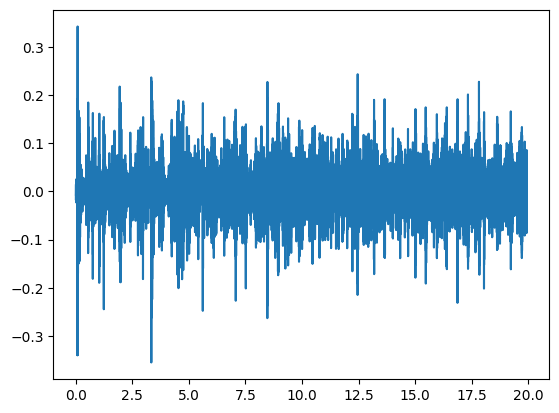

In [ ]:
unconditional_inputs = model.get_unconditional_inputs(num_samples=1)

audio_values = model.generate(**unconditional_inputs, do_sample=True, max_new_tokens=1000)

sampling_rate = model.config.audio_encoder.sampling_rate
display(Audio(audio_values[0].cpu().numpy(), rate=sampling_rate))

number_of_seconds = audio_values.shape[2] / sampling_rate

plt.plot(np.linspace(0, number_of_seconds, audio_values.shape[2]), audio_values[0,0].cpu().numpy())

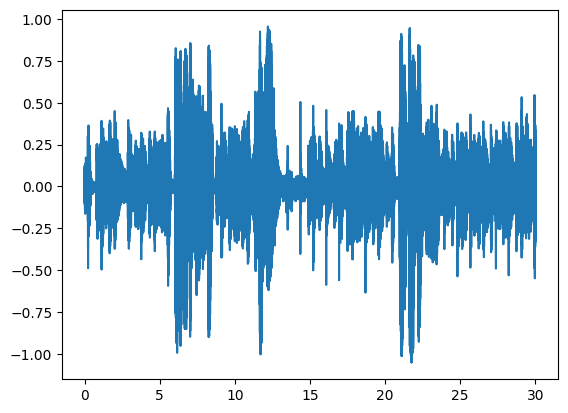

In [ ]:
sample = list(dataset.take(10))[5]["audio"]

sampling_rate = sample["sampling_rate"]
display(Audio(sample["array"], rate=sampling_rate))

number_of_seconds = len(sample["array"]) / sampling_rate

plt.plot(np.linspace(0, number_of_seconds, len(sample["array"])), sample["array"])